In [1]:
# import neccesary libraries
import numpy as np
import pandas as pd
import sklearn 
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import norm, skew

In [2]:
# function to check if a string is numerical or not
def isNumericalString(s):
    for char in s:
        if not (char.isnumeric() or char == '.'):
            return False
    return True

In [15]:
# read the dataset that created before
data = pd.read_csv('video-game-sales-data.csv')
data.shape

(16718, 13)

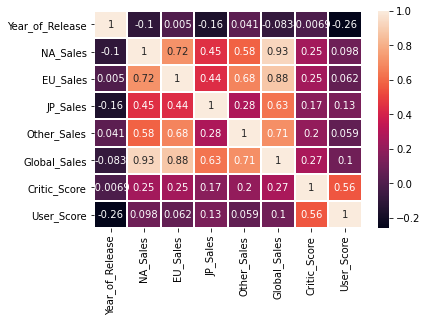

In [5]:
# correlation matrix of dataset
corr = data.corr(method='pearson')
sns.heatmap(data.corr(), annot=True, linewidths=-1)

In [7]:
data.describe()

,Year_of_Release,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,User_Score
count,16709.000000,16718.000000,16718.000000,16718.000000,16718.000000,16718.000000,9468.000000,7635.000000
mean,2006.462685,0.260872,0.143301,0.077381,0.046829,0.528638,69.327841,71.345907
std,5.940915,0.748871,0.451263,0.307504,0.175040,1.412102,14.228337,15.038748
min,1970.000000,0.000000,0.000000,0.000000,0.000000,0.010000,13.000000,0.000000
25%,2003.000000,0.000000,0.000000,0.000000,0.000000,0.060000,61.000000,64.000000
50%,2007.000000,0.080000,0.020000,0.000000,0.010000,0.170000,71.000000,75.000000
75%,2010.000000,0.240000,0.110000,0.040000,0.030000,0.470000,80.000000,82.000000
max,2020.000000,29.080000,12.760000,10.220000,10.570000,40.240000,100.000000,100.000000


In [8]:
data.info()
data.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16718 entries, 0 to 16717
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16716 non-null  object 
 1   Platform         16718 non-null  object 
 2   Year_of_Release  16709 non-null  float64
 3   Genre            16716 non-null  object 
 4   Publisher        16664 non-null  object 
 5   NA_Sales         16718 non-null  float64
 6   EU_Sales         16718 non-null  float64
 7   JP_Sales         16718 non-null  float64
 8   Other_Sales      16718 non-null  float64
 9   Global_Sales     16718 non-null  float64
 10  Critic_Score     9468 non-null   float64
 11  User_Score       7635 non-null   float64
 12  Rating           13002 non-null  object 
dtypes: float64(8), object(5)
memory usage: 1.7+ MB


Name                  2
Platform              0
Year_of_Release       9
Genre                 2
Publisher            54
NA_Sales              0
EU_Sales              0
JP_Sales              0
Other_Sales           0
Global_Sales          0
Critic_Score       7250
User_Score         9083
Rating             3716
dtype: int64

In [16]:
data.head(5)

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,User_Score,Rating
0,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,100.0,NaN,E
1,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,83.0,E
2,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,80.0,E
3,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NaN,NaN,NaN
4,Tetris,GB,1989.0,Puzzle,Nintendo,23.20,2.26,4.22,0.58,30.26,75.0,NaN,E


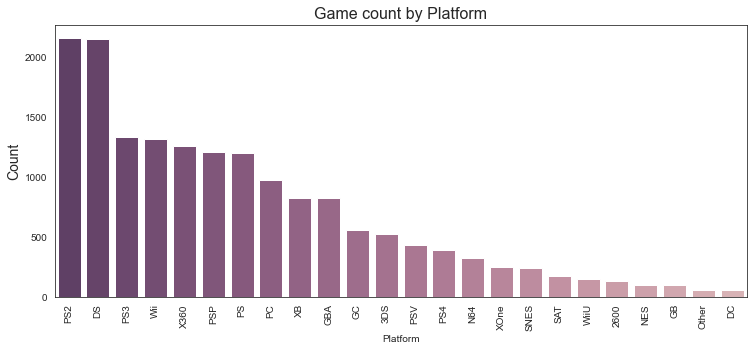

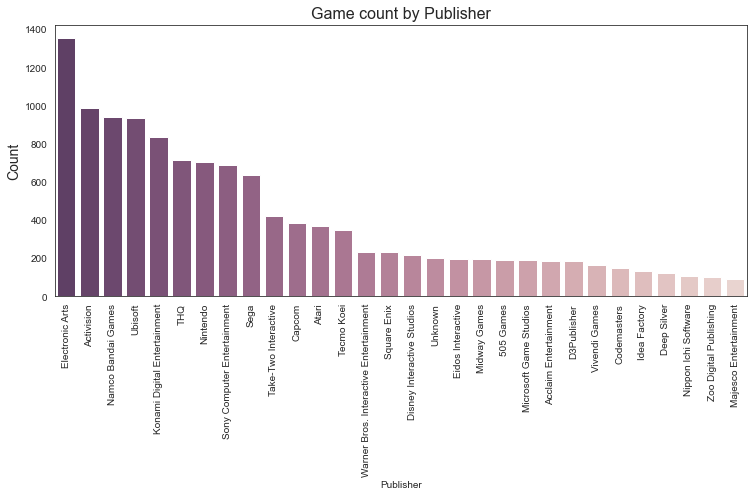

In [17]:
cols = ['Platform', 'Publisher']
for col in cols:
    chart = data[['Name', col]].groupby([col]).count().sort_values('Name', ascending=False).reset_index()
    sns.set_style("white")
    plt.figure(figsize=(12.4, 5))
    plt.xticks(rotation=90)
    sns.barplot(x=col, y='Name', data=chart[:30], palette=sns.cubehelix_palette((12 if col == 'Genre' else 30), dark=0.3, light=.85, reverse=True)).set_title(('Game count by '+col), fontsize=16)
    plt.ylabel('Count', fontsize=14)
    plt.show()    

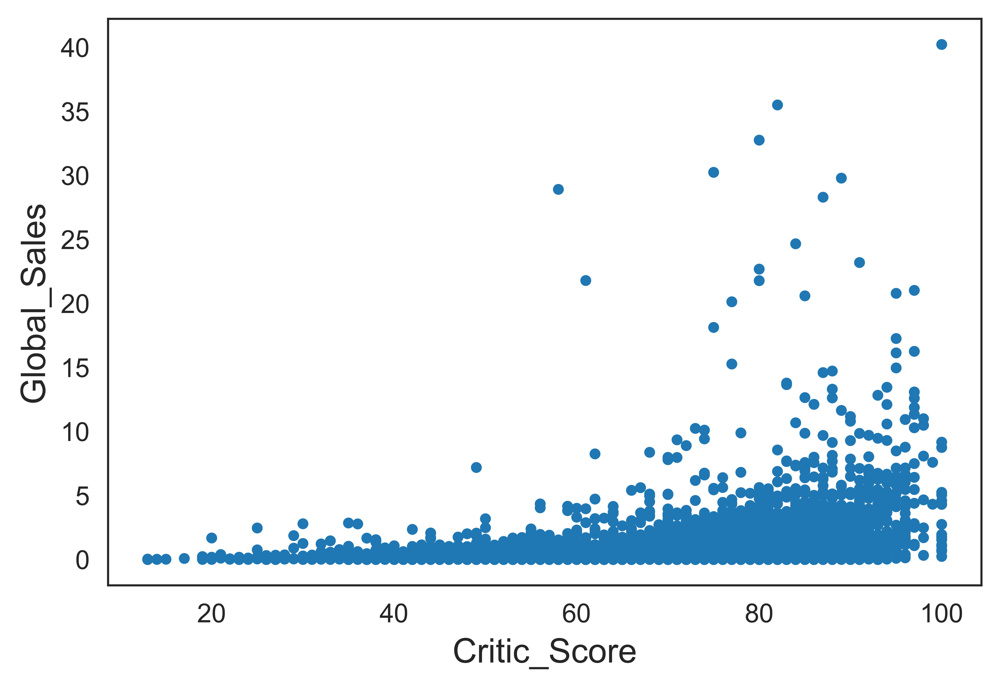

In [18]:
# visualize critic score point and global sales relationship
fig = plt.figure(dpi=1200)
plt.scatter(data['Critic_Score'], data['Global_Sales'], s=10)
plt.ylabel('Global_Sales', fontsize=13)
plt.xlabel('Critic_Score', fontsize=13)
plt.show()

In [19]:
# there are some outliers, we can delete them
data = data.drop(data[(data['Critic_Score']>60) & (data['Global_Sales']>60)].index)

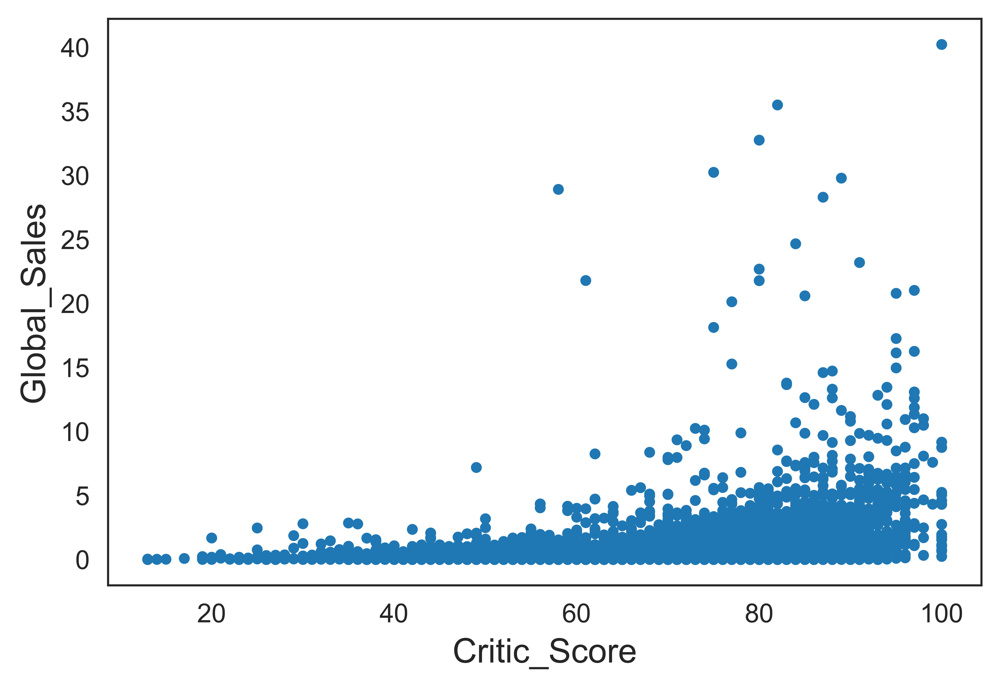

In [20]:
# by plotting again, we can see that we got rid of from an outlier

fig = plt.figure(dpi=1200)
plt.scatter(data['Critic_Score'], data['Global_Sales'], s=10)
plt.ylabel('Global_Sales', fontsize=13)
plt.xlabel('Critic_Score', fontsize=13)
plt.show()

In [21]:
print(data['Year_of_Release'].max())
data.loc[data['Year_of_Release'] > 2020, "Year_of_Release"] /= 10 
print(data['Year_of_Release'].max())

2020.0
2020.0


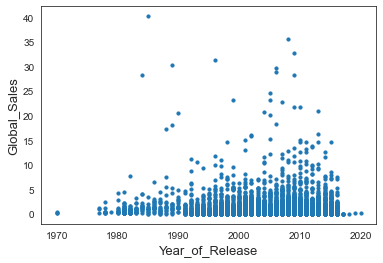

In [22]:
plt.scatter(data['Year_of_Release'], data['Global_Sales'], s=10)
plt.ylabel('Global_Sales', fontsize=13)
plt.xlabel('Year_of_Release', fontsize=13)
plt.show()

In [24]:
# most of the data in 'User_Score' column is not numerical, so convert them

for index, row in data.iterrows():
    var = row['User_Score']
    if isinstance(var, float):
        continue
    if isNumericalString(var):
        data.at[index, 'User_Score'] = float(var) * 10.0
    else:
        data.at[index, 'User_Score'] = np.nan

data['User_Score'] = data['User_Score'].apply(pd.to_numeric)


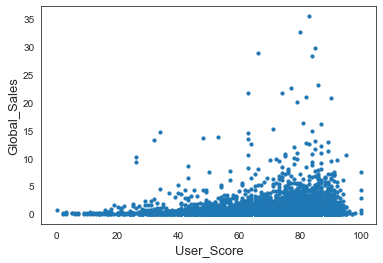

In [25]:
plt.scatter(data['User_Score'], data['Global_Sales'], s=10)
plt.ylabel('Global_Sales', fontsize=13)
plt.xlabel('User_Score', fontsize=13)
plt.show()

In [26]:
# in the dataset, E10 and E10+ is actually same thing, so handle this
for index, row in data.iterrows():
    if row['Rating'] == 'E10+':
        data.at[index, 'Rating'] = 'E10'

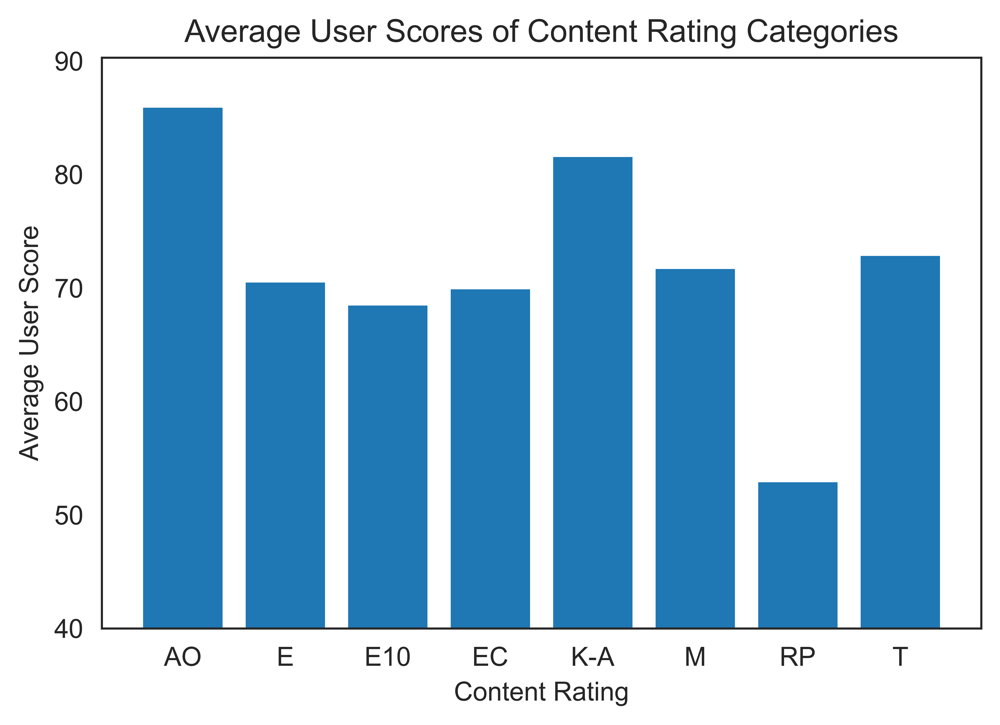

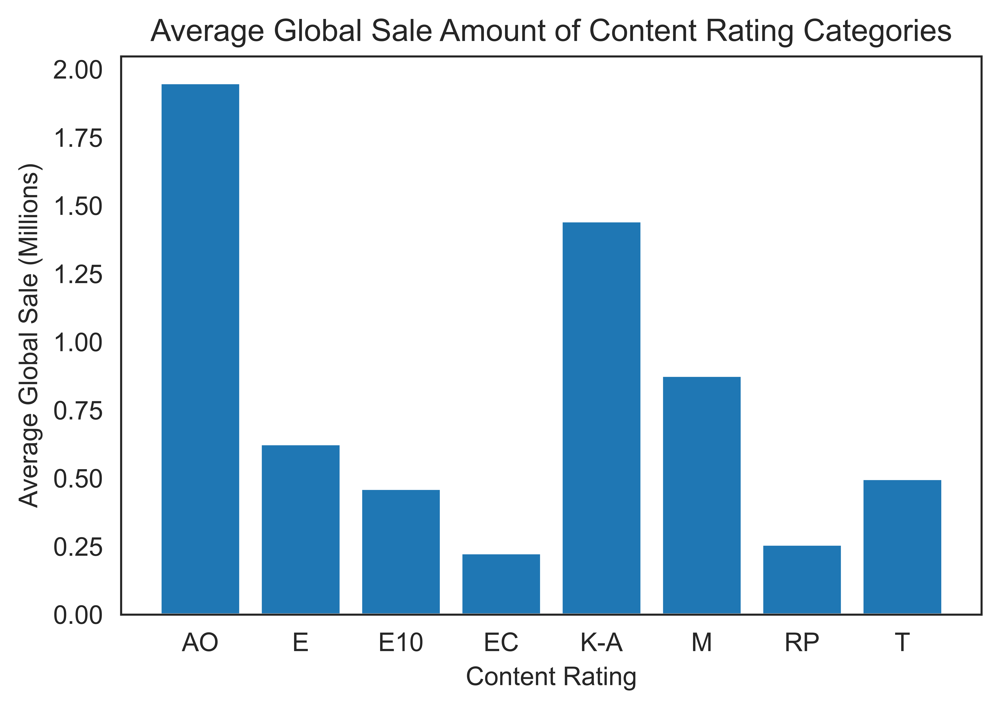

In [27]:
groupedByRating = data.groupby('Rating')
meanRating = groupedByRating.mean()
meanRating = meanRating.reset_index()

fig = plt.figure(dpi=1200)
plt.bar(meanRating['Rating'], meanRating['User_Score'])
plt.ylim(ymin=40)
plt.xlabel('Content Rating') 
plt.ylabel('Average User Score') 
plt.title('Average User Scores of Content Rating Categories') 
plt.show() 

fig = plt.figure(dpi=1200)
plt.bar(meanRating['Rating'], meanRating['Global_Sales'])
plt.xlabel('Content Rating') 
plt.ylabel('Average Global Sale (Millions)') 
plt.title('Average Global Sale Amount of Content Rating Categories') 
plt.show() 

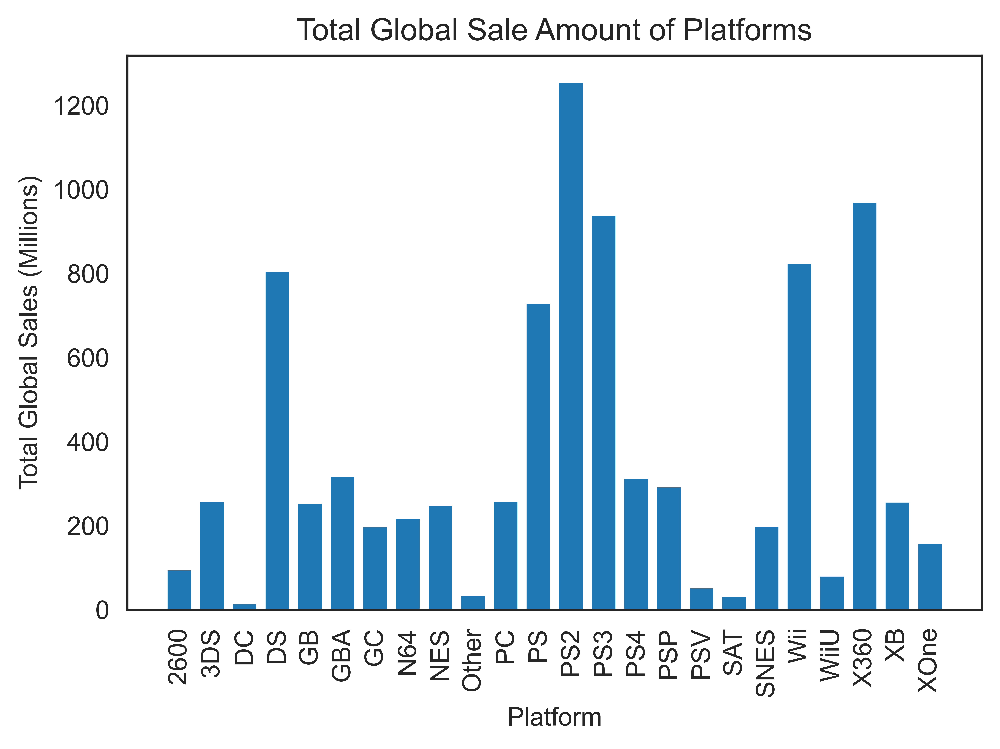

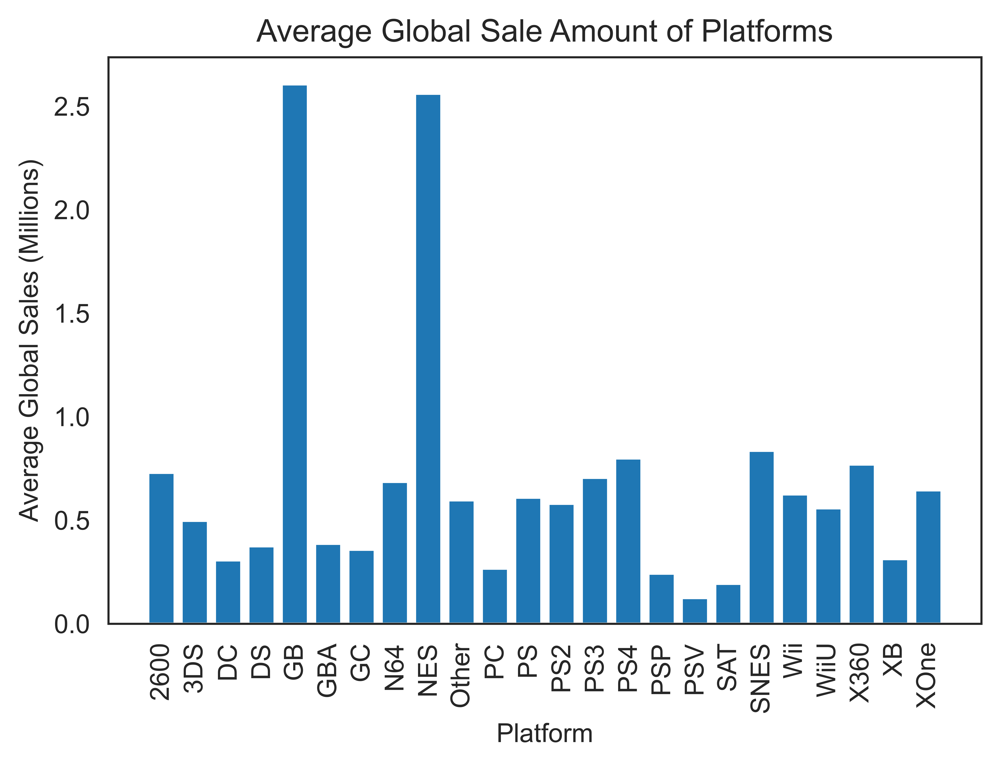

In [28]:
groupedByPlatform = data.groupby('Platform')
sumPlatform = groupedByPlatform.sum().reset_index()
meanPlatform = groupedByPlatform.mean().reset_index()

fig = plt.figure(dpi=1200)
plt.bar(sumPlatform['Platform'], sumPlatform['Global_Sales'])
plt.xlabel('Platform') 
plt.xticks(rotation='vertical')
plt.ylabel('Total Global Sales (Millions)') 
plt.title('Total Global Sale Amount of Platforms') 
plt.show() 

fig = plt.figure(dpi=1200)
plt.bar(meanPlatform['Platform'], meanPlatform['Global_Sales'])
plt.xlabel('Platform') 
plt.xticks(rotation='vertical')
plt.ylabel('Average Global Sales (Millions)') 
plt.title('Average Global Sale Amount of Platforms') 
plt.show() 

In [29]:
fig = plt.figure(dpi=1200, figsize=(16,8))
ax1 = plt.subplot(121, aspect='equal')
sumPlatform.plot(kind='pie', y = 'Global_Sales', ax=ax1, autopct='%1.1f%%', 
        startangle=90, shadow=False, labels=sumPlatform['Platform'], legend = False, 
        title='Global Sale Distribution and Platform', fontsize=10)
plt.show()


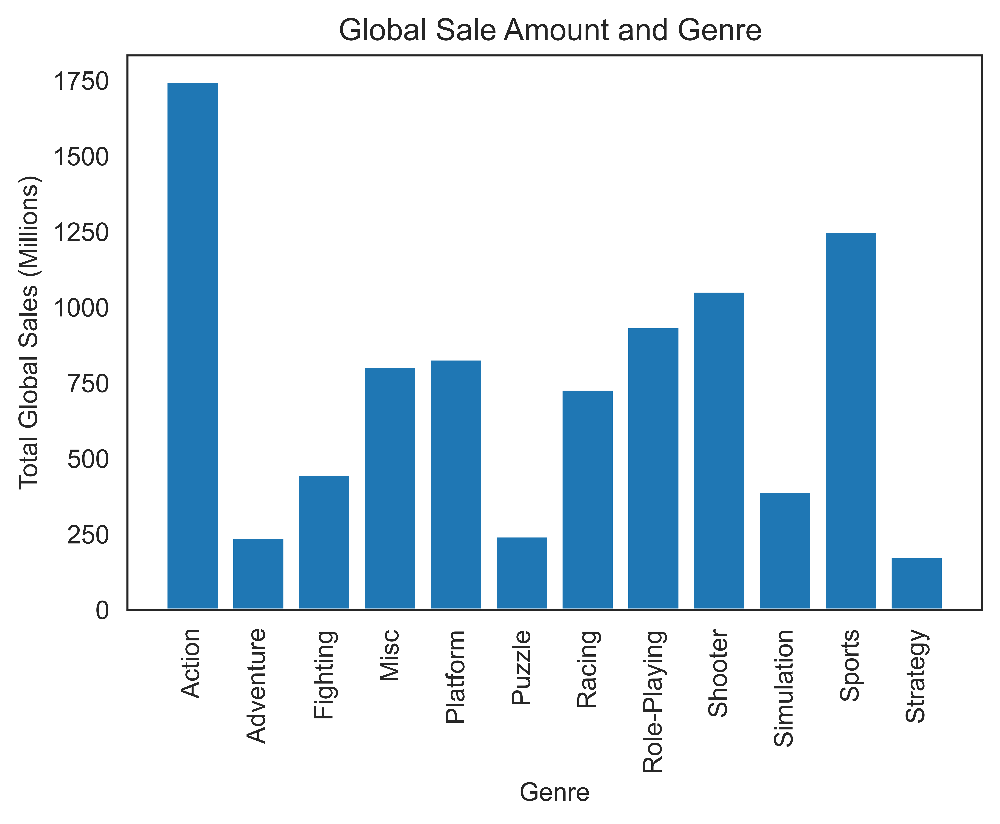

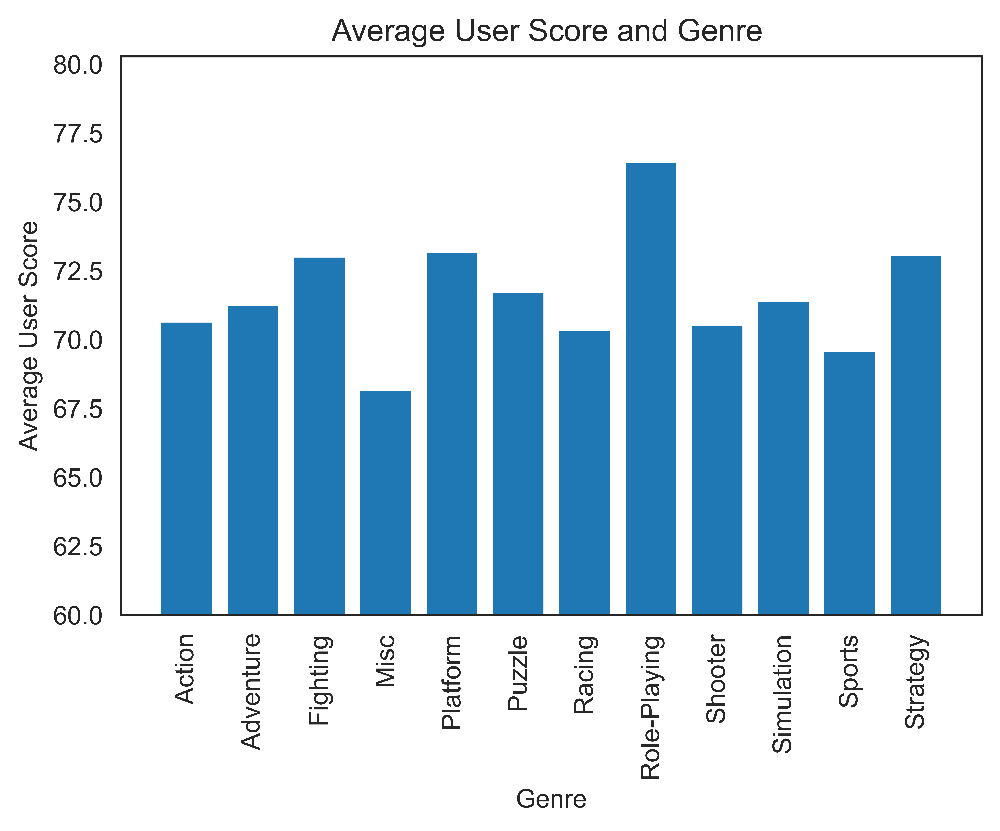

In [30]:
# genre visualization

groupedByGenre = data.groupby('Genre')
sumGenre = groupedByGenre.sum().reset_index()
meanGenre = groupedByGenre.mean().reset_index()

fig = plt.figure(dpi=1200)
plt.bar(sumGenre['Genre'], sumGenre['Global_Sales'])
plt.xlabel('Genre') 
plt.xticks(rotation='vertical')
plt.ylabel('Total Global Sales (Millions)') 
plt.title('Global Sale Amount and Genre ') 
plt.show() 

fig = plt.figure(dpi=1200)
plt.bar(sumGenre['Genre'], meanGenre['User_Score'])
plt.xlabel('Genre') 
plt.xticks(rotation='vertical')
plt.ylabel('Average User Score') 
plt.ylim(ymin=60)
plt.title('Average User Score and Genre ') 
plt.show() 

In [31]:
fig = plt.figure(dpi=1200, figsize=(16,8))
ax1 = plt.subplot(121, aspect='equal')
sumGenre.plot(kind='pie', y = 'Global_Sales', ax=ax1, autopct='%1.1f%%', 
        startangle=90, shadow=False, labels=sumGenre['Genre'], legend = False, 
        title='Global Sales Distribution and Genre', fontsize=10)
plt.show()

In [32]:
# TOP 100 Selled Games

top100 = data.sort_values('Global_Sales',ascending = False).head(100)
top100GroupedGenre = top100.groupby('Genre')
top100GroupedPublisher = top100.groupby('Publisher')
top100SumGenre = top100GroupedGenre.sum().reset_index()
top100SumPublisher = top100GroupedPublisher.sum().reset_index()

In [33]:
fig = plt.figure(dpi=1200, figsize=(16,8))
ax1 = plt.subplot(121, aspect='equal')
top100SumGenre.plot(kind='pie', y = 'Global_Sales', ax=ax1, autopct='%1.1f%%', 
        startangle=90, shadow=False, labels=top100SumGenre['Genre'], legend = False, 
        title='TOP 100 Selled Game, Sales Distribution and Genre', fontsize=10)
plt.show()

fig = plt.figure(dpi=1200, figsize=(16,8))
ax1 = plt.subplot(121, aspect='equal')
top100SumPublisher.plot(kind='pie', y = 'Global_Sales', ax=ax1, autopct='%1.1f%%', 
        startangle=90, shadow=False, labels=top100SumPublisher['Publisher'], legend = False, 
        title='TOP 100 Selled Game, Sale Distributions and Publisher Company', fontsize=10)
plt.show()

In [34]:
# in the dataset, each row specified with a platform, so one game that has multiple
# platform oppurtunity, exists in dataset multiple times. To visualize most selled
# games by ingoring platform we need to group them by name

groupedByName = data.groupby('Name')
top20AllPlatforms = groupedByName.sum().reset_index()
top20AllPlatforms = top20AllPlatforms.sort_values('Global_Sales', ascending=False).head(20)

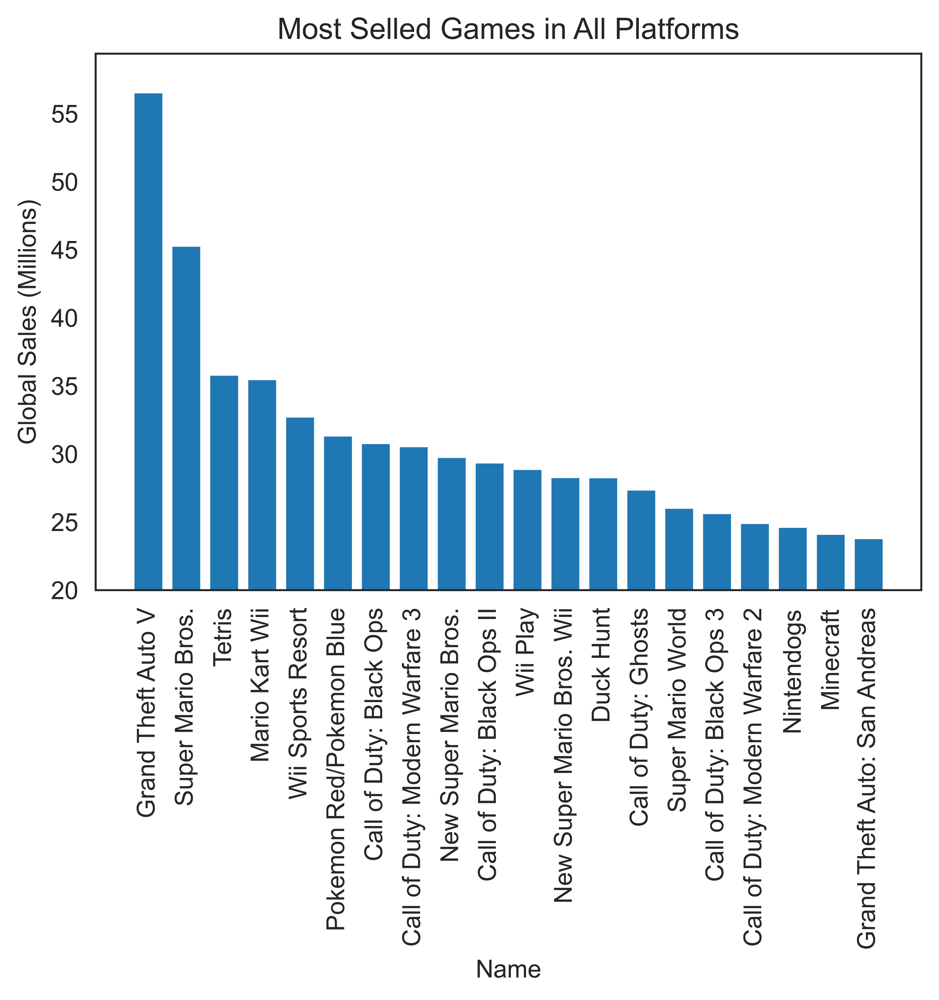

In [35]:
fig = plt.figure(dpi=1200)
plt.bar(top20AllPlatforms['Name'], top20AllPlatforms['Global_Sales'])
plt.ylim(ymin=20)
plt.xlabel('Name') 
plt.xticks(rotation='vertical')
plt.ylabel('Global Sales (Millions)') 
plt.title('Most Selled Games in All Platforms') 
plt.show() 

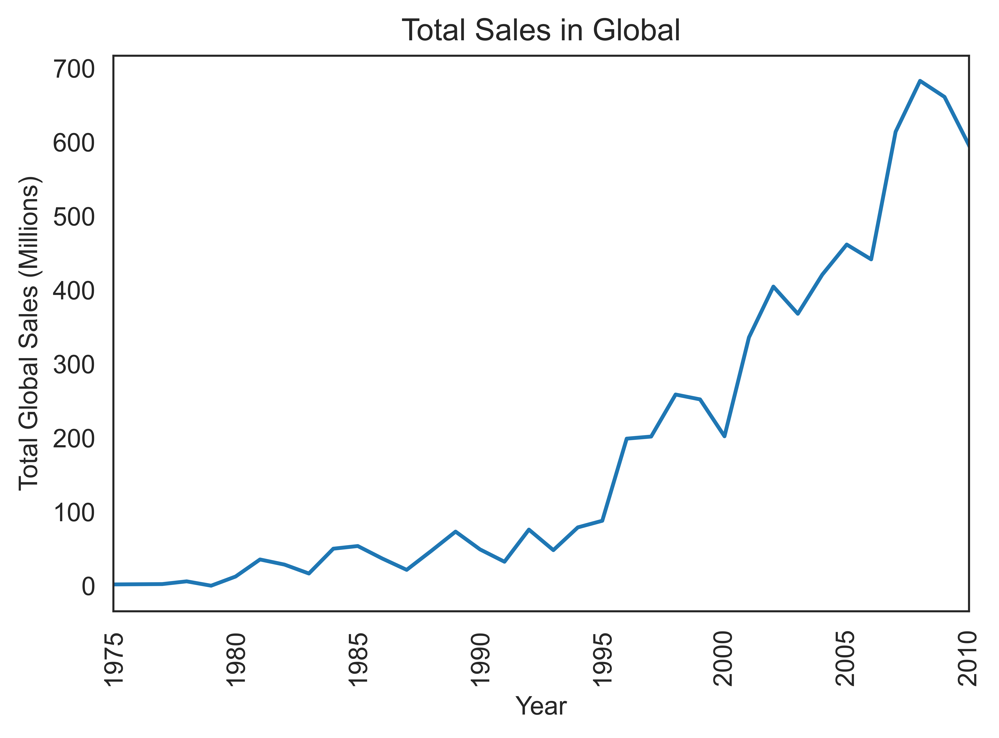

In [36]:
# total sale amounts in global by year

groupedByYear = data.groupby('Year_of_Release')
sumByYear = groupedByYear.sum().reset_index()

fig = plt.figure(dpi=1200)
plt.plot(sumByYear['Year_of_Release'], sumByYear['Global_Sales'])
plt.xlabel('Year')
plt.xlim(xmin=1975, xmax=2010)
plt.xticks(rotation='vertical')
plt.ylabel('Total Global Sales (Millions)')
plt.title('Total Sales in Global')
plt.show() 

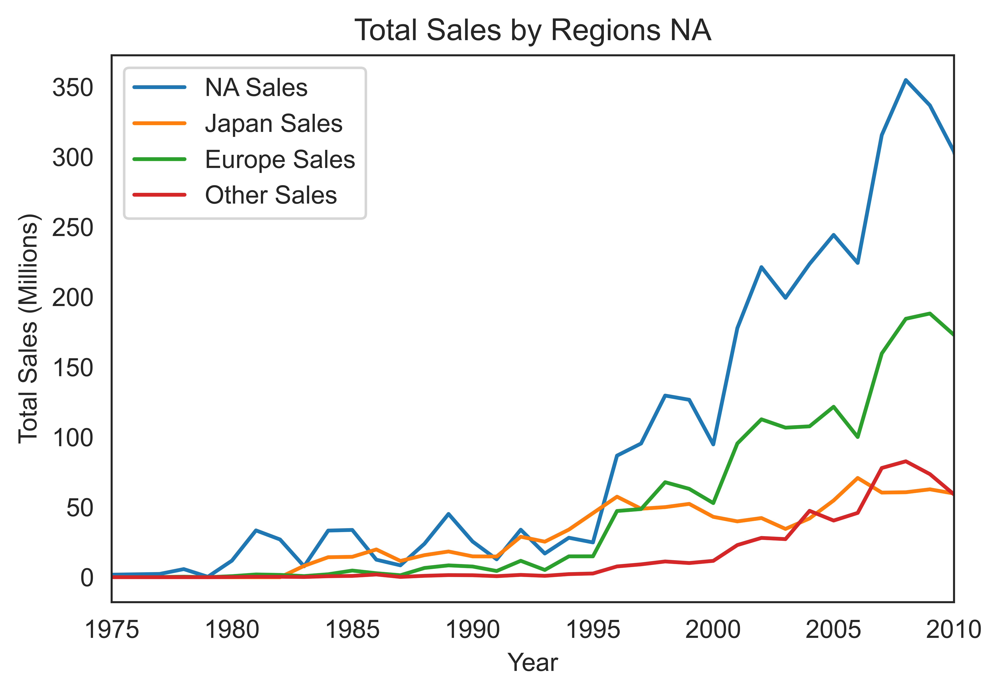

In [43]:
groupedByYear = data.groupby(by="Year_of_Release")
sumByYear = groupedByYear.sum().reset_index()
fig = plt.figure(dpi=1200)
plt.plot(sumByYear['Year_of_Release'], sumByYear['NA_Sales'], label = 'NA Sales')
plt.plot(sumByYear['Year_of_Release'], sumByYear['JP_Sales'], label = 'Japan Sales')
plt.plot(sumByYear['Year_of_Release'], sumByYear['EU_Sales'], label = 'Europe Sales')
plt.plot(sumByYear['Year_of_Release'], sumByYear['Other_Sales'], label = 'Other Sales')
plt.xlabel('Year')
plt.xlim(xmin=1975, xmax=2010)
plt.ylabel('Total Sales (Millions)')
plt.title('Total Sales by Regions NA')
plt.legend()
plt.show()        

In [44]:
# we can drop the columns that are not going to effect the prediction results directly
data.drop(['Name', 'NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales'], axis='columns', inplace=True)

In [47]:
# see the counts of different platform types
data['Platform'].value_counts()

PS2      2161
DS       2152
PS3      1331
Wii      1319
X360     1262
PSP      1209
PS       1197
PC        974
XB        824
GBA       822
GC        556
3DS       520
PSV       432
PS4       393
N64       319
XOne      247
SNES      239
SAT       173
WiiU      147
2600      133
GB         98
NES        98
Other      60
DC         52
Name: Platform, dtype: int64

In [48]:
# mark rare platforms as 'other' category
data.loc[data['Platform'].isin((data['Platform'].value_counts()
                                [data['Platform'].value_counts() < 50]).index), 'Platform'] = 'Other'


In [49]:
# turn Genre and Platform column into dummy variable

dummyGenre = pd.get_dummies(data['Genre'])
dummyPlatform = pd.get_dummies(data['Platform'])
data = pd.concat([data,dummyGenre], axis=1)
data = pd.concat([data, dummyPlatform], axis=1)
data.drop(['Genre', 'Platform'], axis=1, inplace=True)

In [50]:
cols = data.columns.tolist()
cols = cols[:2] + cols[3:] + cols[2:3]
data = data[cols]
data.head(5)

,Year_of_Release,Publisher,Critic_Score,User_Score,Rating,Action,Adventure,Fighting,Misc,Puzzle,...,PSP,PSV,SAT,SNES,Wii,WiiU,X360,XB,XOne,Global_Sales
0,1985.0,Nintendo,100.0,NaN,E,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,40.24
1,2008.0,Nintendo,82.0,83.0,E,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,35.52
2,2009.0,Nintendo,80.0,80.0,E,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,32.77
3,1996.0,Nintendo,NaN,NaN,NaN,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,31.37
4,1989.0,Nintendo,75.0,NaN,E,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,30.26


In [51]:
# fill missing values with mean of column
data = data.fillna(data.mean())

In [52]:
from sklearn.preprocessing import LabelEncoder
lblEncoderRating = LabelEncoder()
lblEncoderPublisher = LabelEncoder()

In [53]:
data['Rating'] = lblEncoderRating.fit_transform(data['Rating'].astype(str))
data['Publisher'] = lblEncoderPublisher.fit_transform(data['Publisher'].astype(str))

In [ ]:
from sklearn.model_selection import train_test_split



x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.2)

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)
